In [1]:
from  nilearn import plotting
%matplotlib inline
import os
from os.path import join as opj
import json
from nipype.interfaces.spm import Level1Design, EstimateModel, EstimateContrast
from nipype.algorithms.modelgen import SpecifySPMModel
from nipype.interfaces.utility import Function, IdentityInterface
from nipype.interfaces.io import SelectFiles, DataSink
from nipype import Workflow, Node
import pandas as pd

Failed to import duecredit due to No module named 'duecredit'
/home/zohyos7/anaconda3/lib/python3.6/site-packages/bids/grabbids/__init__.py:6: FutureWarning: grabbids has been renamed to layout in version 0.6.5, and will be removed in version 0.8
  warnings.warn("grabbids has been renamed to layout in version 0.6.5, and will be removed in version 0.8", FutureWarning)


In [2]:
from nipype.interfaces.matlab import MatlabCommand
MatlabCommand.set_default_paths('/opt/spm12')

In [3]:
experiment_dir  = '/data/wellbeing_analysis'
output_dir = 'datasink'
working_dir = 'workingdir'

task_list = ['tom']

In [4]:
subject_list = os.listdir("/data/wellbeing_bids")
subject_list.remove('dataset_description.json')

subject_list = [sub[-4:] for sub in subject_list]

In [5]:
# TR of functional images
TR = 2

# Smoothing withds used during preprocessing
fwhm = [4, 8]

In [6]:
# SpecifyModel - Generates SPM-specific Model# Speci 
modelspec = Node(SpecifySPMModel(concatenate_runs=False,
                                 input_units='secs',
                                 output_units='secs',
                                 time_repetition=TR,
                                 high_pass_filter_cutoff=128),
                 name="modelspec")

# Level1Design - Generates an SPM design matrix
level1design = Node(Level1Design(bases={'hrf': {'derivs': [1, 0]}},
                                 timing_units='secs',
                                 interscan_interval=TR,
                                 model_serial_correlations='FAST'),
                    name="level1design")

# EstimateModel - estimate the parameters of the model
level1estimate = Node(EstimateModel(estimation_method={'Classical': 1}),
                      name="level1estimate")

# EstimateContrast - estimates contrasts
level1conest = Node(EstimateContrast(), name="level1conest")

In [8]:
# Condition names# Condi 
condition_names = ['neutral','happy','sad','fear']

# Contrasts
cont01 = ['average', 'T', condition_names, [0.25,0.25,0.25,0.25]]
cont02 = ['neutral', 'T', condition_names, [1, 0, 0, 0]]
cont03 = ['happy', 'T', condition_names, [0, 1, 0, 0]]
cont04 = ['sad', 'T', condition_names, [0, 0, 1, 0]]
cont05 = ['fear', 'T', condition_names, [0, 0, 0, 1]]
cont06 = ['neutral > others', 'T', condition_names, [1, -1/3., -1/3., -1/3.]]
cont07 = ['happy > others', 'T', condition_names, [-1/3., 1, -1/3., -1/3.]]
cont08 = ['sad > others', 'T', condition_names, [-1/3., -1/3., 1, -1/3.]]
cont09 = ['fear > others', 'T', condition_names, [-1/3., -1/3., -1/3., 1]]
cont10 = ['neutral > happy','T', condition_names, [1,-1,0,0]]
cont11 = ['neutral > sad','T', condition_names, [1,0,-1,0]]
cont12 = ['neutral > fear','T', condition_names, [1,0,0,-1]]
cont13 = ['happy > sad' ,'T', condition_names, [0,1,-1,0]]
cont14 = ['happy > fear','T', condition_names, [0,1,0,-1]]
cont15 = ['sad > fear','T', condition_names, [0,0,1,-1]]
cont16 = ['happy > sad & fear', 'T', condition_names, [0, 1, -0.5, -0.5]]

cont17 = ['activation', 'F', [cont02, cont03, cont04, cont05]]
cont18 = ['differences_1', 'F', [cont06, cont07, cont08, cont09]]
cont19 = ['differences_2', 'F', [cont10, cont11, cont12, cont13, cont14, cont15]]

contrast_list = [cont01, cont02, cont03, cont04, cont05, cont06, cont07, cont08, cont09, cont10, cont11, cont12, cont13, cont14, cont15, cont16, cont17, cont18, cont19]

In [9]:
def subjectinfo(subject_id):

    import pandas as pd
    from nipype.interfaces.base import Bunch
    
    trialinfo = pd.read_table('/data/wellbeing_bids/sub-%s/func/sub-%s_task-empathy_events.tsv' % (subject_id,subject_id))
    trialinfo['iCond'] = trialinfo['iCond'].apply({1:'neutral',2:'happy',3:'sad',4:'fear'}.get)
    trialinfo.head()
    d = {'neutral':1,'happy':2,'sad':3,'fear':4}
    conditions = []
    onsets = []
    durations = []

    for group in sorted(trialinfo.groupby('iCond'), key=lambda x:d[x[0]]):
        conditions.append(group[0])
        onsets.append(list(group[1].onset))
        durations.append(group[1].duration.tolist())

    subject_info = [Bunch(conditions=conditions,
                          onsets=onsets,
                          durations=durations)]

    return subject_info  # this output will later be returned to infosource

# Get Subject Info - get subject specific condition information
getsubjectinfo = Node(Function(input_names=['subject_id'],
                               output_names=['subject_info'],
                               function=subjectinfo),
                      name='getsubjectinfo')

In [10]:
# Infosource - a function free node to iterate over the list of subject names
infosource = Node(IdentityInterface(fields=['subject_id',
                                            'task_name',
                                            'fwhm_id',
                                            'contrasts'],
                                    contrasts=contrast_list),
                  name="infosource")
infosource.iterables = [('subject_id', subject_list),
                        ('task_name', task_list),
                        ('fwhm_id', fwhm)]

# SelectFiles - to grab the data (alternativ to DataGrabber)
templates = {'func': opj(output_dir, 'antsflow', 'sub-{subject_id}', 'bold', 'task-{task_name}',
                         'fwhm-{fwhm_id}_sasub-{subject_id}_task-{task_name}_bold_trans.nii'),
             'mc_param': opj(output_dir, 'preproc', 'sub-{subject_id}', 'task-{task_name}',
                             'asub-{subject_id}_task-{task_name}_bold.par'),
             'outliers': opj(output_dir, 'preproc', 'sub-{subject_id}', 'task-{task_name}', 
                             'art.asub-{subject_id}_task-{task_name}_bold_outliers.txt')}
selectfiles = Node(SelectFiles(templates,
                               base_directory=experiment_dir,
                               sort_filelist=True),
                   name="selectfiles")

# Datasink - creates output folder for important outputs
datasink = Node(DataSink(base_directory=experiment_dir,
                         container=output_dir),
                name="datasink")

# Use the following DataSink output substitutions
substitutions = [('_fwhm_id_%s_subject_id_%s_task_name_empathy' % (f, sub), 
                  'sub-%s/task-empathy/fwhm-%s/' % (sub, f))
                 for f in fwhm
                 for sub in subject_list]
datasink.inputs.substitutions = substitutions

In [11]:

# Initiation of the 1st-level analysis workflow# Initi 
l1analysis = Workflow(name='l1analysis')
l1analysis.base_dir = opj(experiment_dir, working_dir)

# Connect up the 1st-level analysis components
l1analysis.connect([(infosource, selectfiles, [('subject_id', 'subject_id'),
                                               ('task_name', 'task_name'),
                                               ('fwhm_id', 'fwhm_id')]),
                    (infosource, getsubjectinfo, [('subject_id',
                                                   'subject_id')]),
                    (getsubjectinfo, modelspec, [('subject_info',
                                                  'subject_info')]),
                    (infosource, level1conest, [('contrasts', 'contrasts')]),
                    (selectfiles, modelspec, [('func', 'functional_runs')]),
                    (selectfiles, modelspec, [('mc_param', 'realignment_parameters'),
                                              ('outliers', 'outlier_files')]),
                    (modelspec, level1design, [('session_info',
                                                'session_info')]),
                    (level1design, level1estimate, [('spm_mat_file',
                                                     'spm_mat_file')]),
                    (level1estimate, level1conest, [('spm_mat_file',
                                                     'spm_mat_file'),
                                                    ('beta_images',
                                                     'beta_images'),
                                                    ('residual_image',
                                                     'residual_image')]),
                    (level1conest, datasink, [('spm_mat_file', '1stLevel.@spm_mat'),
                                              ('spmT_images', '1stLevel.@T'),
                                              ('con_images', '1stLevel.@con'),
                                              ('spmF_images', '1stLevel.@F'),
                                              ('ess_images', '1stLevel.@ess'),
                                              ]),
                    ])

180921-17:38:28,926 nipype.workflow INFO:
	 Generated workflow graph: /data/wellbeing_analysis/workingdir/l1analysis/graph.png (graph2use=colored, simple_form=True).


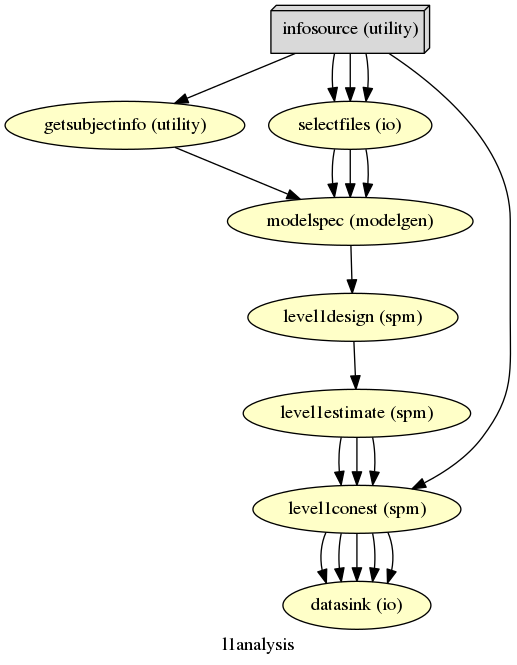

In [12]:
# Create 1st-level analysis output graph# Creat 
l1analysis.write_graph(graph2use='colored', format='png', simple_form=True)

# Visualize the graph
from IPython.display import Image
Image(filename=opj(l1analysis.base_dir, 'l1analysis', 'graph.png'))

In [13]:
l1analysis.run('MultiProc', plugin_args={'n_procs': 10})

180921-17:38:36,373 nipype.workflow INFO:
	 Workflow l1analysis settings: ['check', 'execution', 'logging', 'monitoring']
180921-17:38:46,744 nipype.workflow INFO:
	 Running in parallel.
180921-17:38:46,929 nipype.workflow INFO:
	 [MultiProc] Running 0 tasks, and 996 jobs ready. Free memory (GB): 113.22/113.22, Free processors: 10/10.
180921-17:38:47,102 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.selectfiles" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2677_task_name_empathy/selectfiles".
180921-17:38:47,104 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.getsubjectinfo" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2677_task_name_empathy/getsubjectinfo".
180921-17:38:47,107 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.selectfiles" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3140_task_name_empathy/selectfiles".
180921-17:38:47,112 nipype.workflow INFO:
	 [Node] Running "getsub

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3043_task_name_empathy/modelspec/art.asub-3043_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-17:38:53,261 nipype.workflow INFO:
	 [Node] Running "level1design" ("nipype.interfaces.spm.model.Level1Design")
180921-17:38:53,277 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-17:38:53,284 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-17:38:54,939 nipype.workflow INFO:
	 [Job 51] Completed (l1analysis.modelspec).
180921-17:38:54,948 nipype.workflow INFO:
	 [Job 58] Completed (l1analysis.modelspec).
180921-17:38:54,956 nipype.workflow INFO:
	 [Job 63] Completed (l1analysis.selectfiles).
180921-17:38:54,980 nipype.workflow INFO:
	 [MultiProc] Running 7 tasks, and 979 jobs ready. Free memory (GB): 111.82/113.22, Free processors: 3/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3043_task_name_empathy/modelspec/art.asub-3043_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-17:38:57,212 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-17:38:58,938 nipype.workflow INFO:
	 [Job 65] Completed (l1analysis.modelspec).
180921-17:38:58,968 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 977 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
180921-17:38:59,129 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3043_task_name_empathy/level1design".


/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2528_task_name_empathy/modelspec/art.asub-2528_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-18:05:32,802 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-18:05:34,526 nipype.workflow INFO:
	 [Job 86] Completed (l1analysis.modelspec).
180921-18:05:34,552 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 971 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
180921-18:05:34,686 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2528_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2528_task_name_empathy/modelspec/art.asub-2528_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-18:10:49,152 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-18:10:50,831 nipype.workflow INFO:
	 [Job 93] Completed (l1analysis.modelspec).
180921-18:10:50,864 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 969 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
180921-18:10:51,32 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2528_task_name_empathy/leve

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2607_task_name_empathy/modelspec/art.asub-2607_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-18:22:31,841 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-18:22:33,551 nipype.workflow INFO:
	 [Job 100] Completed (l1analysis.modelspec).
180921-18:22:33,588 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 967 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180921-18:22:33,755 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2607_task_name_empathy/le

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2607_task_name_empathy/modelspec/art.asub-2607_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-18:22:54,22 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-18:22:55,559 nipype.workflow INFO:
	 [Job 107] Completed (l1analysis.modelspec).
180921-18:22:55,574 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 965 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180921-18:22:55,715 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2607_task_name_empathy/lev

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3005_task_name_empathy/modelspec/art.asub-3005_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-19:41:36,632 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-19:41:38,224 nipype.workflow INFO:
	 [Job 212] Completed (l1analysis.modelspec).
180921-19:41:38,257 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 935 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
180921-19:41:38,480 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3005_task_name_empathy/leve

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3005_task_name_empathy/modelspec/art.asub-3005_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-19:44:24,750 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-19:44:26,390 nipype.workflow INFO:
	 [Job 219] Completed (l1analysis.modelspec).
180921-19:44:26,420 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 933 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
180921-19:44:26,605 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3005_task_name_empathy/level1

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2918_task_name_empathy/modelspec/art.asub-2918_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-21:54:11,866 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-21:54:13,431 nipype.workflow INFO:
	 [Job 450] Completed (l1analysis.modelspec).
180921-21:54:13,456 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 867 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
180921-21:54:13,638 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2918_task_name_empathy/level1de

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2918_task_name_empathy/modelspec/art.asub-2918_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-22:04:30,46 nipype.workflow INFO:
	 [MultiProc] Running 10 tasks, and 864 jobs ready. Free memory (GB): 111.22/113.22, Free processors: 0/10.
                     Currently running:
                       * l1analysis.modelspec
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
180921-22:04:30,72 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-22:04:32,42 nipype.workflow INFO:
	 [Job 457] Completed (l1analysis.modelspec).
180921-22:04:32,73 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 865 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3154_task_name_empathy/modelspec/art.asub-3154_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-23:13:15,558 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-23:13:16,943 nipype.workflow INFO:
	 [Job 562] Completed (l1analysis.modelspec).
180921-23:13:16,954 nipype.workflow INFO:
	 [Job 567] Completed (l1analysis.selectfiles).
180921-23:13:16,984 nipype.workflow INFO:
	 [MultiProc] Running 8 tasks, and 834 jobs ready. Free memory (GB): 111.62/113.22, Free processors: 2/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
                       * l1analysis.level1conest
180921-23:13:17,224 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3154_task_name_empathy/modelspec/art.asub-3154_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180921-23:13:20,220 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180921-23:13:20,293 nipype.workflow INFO:
	 [Node] Finished "l1analysis.level1conest".
180921-23:13:20,938 nipype.workflow INFO:
	 [Job 432] Completed (l1analysis.level1conest).
180921-23:13:20,946 nipype.workflow INFO:
	 [Job 569] Completed (l1analysis.modelspec).
180921-23:13:20,974 nipype.workflow INFO:
	 [MultiProc] Running 8 tasks, and 834 jobs ready. Free memory (GB): 111.62/113.22, Free processors: 2/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
180921-23:13:21,185 nipype.workflow INFO:
	 [Node] Setting-

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2603_task_name_empathy/modelspec/art.asub-2603_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-00:01:46,104 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-00:01:47,816 nipype.workflow INFO:
	 [Job 660] Completed (l1analysis.modelspec).
180922-00:01:47,844 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 807 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
180922-00:01:48,32 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2603_task_name_empathy/level

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2603_task_name_empathy/modelspec/art.asub-2603_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-00:03:46,236 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-00:03:47,935 nipype.workflow INFO:
	 [Job 667] Completed (l1analysis.modelspec).
180922-00:03:47,953 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 805 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
180922-00:03:48,232 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2603_task_name_empathy/level1de

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3115_task_name_empathy/modelspec/art.asub-3115_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-00:04:06,683 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-00:04:07,950 nipype.workflow INFO:
	 [Job 674] Completed (l1analysis.modelspec).
180922-00:04:07,977 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 803 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
180922-00:04:08,164 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3115_task_name_empathy/level1de

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3115_task_name_empathy/modelspec/art.asub-3115_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-00:17:03,337 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-00:17:04,723 nipype.workflow INFO:
	 [Job 681] Completed (l1analysis.modelspec).
180922-00:17:04,749 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 801 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
180922-00:17:05,21 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3115_task_name_empathy/lev

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3156_task_name_empathy/modelspec/art.asub-3156_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-01:34:24,146 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-01:34:25,611 nipype.workflow INFO:
	 [Job 800] Completed (l1analysis.modelspec).
180922-01:34:25,638 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 767 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-01:34:25,847 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3156_task_name_empath

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3156_task_name_empathy/modelspec/art.asub-3156_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-01:37:10,131 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-01:37:11,774 nipype.workflow INFO:
	 [Job 807] Completed (l1analysis.modelspec).
180922-01:37:11,799 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 765 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-01:37:11,989 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3156_task_name_empathy/

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2793_task_name_empathy/modelspec/art.asub-2793_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-02:17:36,159 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-02:17:36,209 nipype.workflow INFO:
	 [Job 870] Completed (l1analysis.modelspec).
180922-02:17:36,239 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 747 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-02:17:36,522 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2793_task_name_empathy/le

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2793_task_name_empathy/modelspec/art.asub-2793_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-02:20:10,880 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-02:20:12,359 nipype.workflow INFO:
	 [Job 877] Completed (l1analysis.modelspec).
180922-02:20:12,387 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 745 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-02:20:12,581 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2793_task_name_empathy/le

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2568_task_name_empathy/modelspec/art.asub-2568_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-02:52:18,837 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-02:52:20,265 nipype.workflow INFO:
	 [Job 940] Completed (l1analysis.modelspec).
180922-02:52:20,296 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 727 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
180922-02:52:20,603 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2568_task_name_empathy/level1

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2568_task_name_empathy/modelspec/art.asub-2568_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-02:55:26,831 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-02:55:28,453 nipype.workflow INFO:
	 [Job 947] Completed (l1analysis.modelspec).
180922-02:55:28,479 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 725 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
180922-02:55:28,673 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2568_task_name_empathy/level1de

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3050_task_name_empathy/modelspec/art.asub-3050_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-03:28:14,741 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-03:28:16,393 nipype.workflow INFO:
	 [Job 996] Completed (l1analysis.modelspec).
180922-03:28:16,424 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 711 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
180922-03:28:16,752 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3050_task_name_empathy/le

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3050_task_name_empathy/modelspec/art.asub-3050_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-03:41:47,505 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-03:41:49,203 nipype.workflow INFO:
	 [Job 1003] Completed (l1analysis.modelspec).
180922-03:41:49,229 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 709 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-03:41:49,427 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3050_task_name_empat

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2915_task_name_empathy/modelspec/art.asub-2915_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-04:30:59,574 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-04:31:00,109 nipype.workflow INFO:
	 [Job 1066] Completed (l1analysis.modelspec).
180922-04:31:00,139 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 691 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1conest
                       * l1analysis.level1conest
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-04:31:00,378 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2915_task_name_empathy/level

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2915_task_name_empathy/modelspec/art.asub-2915_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-04:31:48,435 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-04:31:50,146 nipype.workflow INFO:
	 [Job 1073] Completed (l1analysis.modelspec).
180922-04:31:50,162 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 689 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1conest
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-04:31:50,363 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2915_task_name_empathy/level

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3136_task_name_empathy/modelspec/art.asub-3136_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-04:47:22,505 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-04:47:23,57 nipype.workflow INFO:
	 [Job 1108] Completed (l1analysis.modelspec).
180922-04:47:23,83 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 679 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-04:47:23,292 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3136_task_name_empathy/level1des

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3136_task_name_empathy/modelspec/art.asub-3136_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-04:49:07,528 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-04:49:09,157 nipype.workflow INFO:
	 [Job 1115] Completed (l1analysis.modelspec).
180922-04:49:09,185 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 677 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-04:49:09,469 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3136_task_name_empathy/level

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2785_task_name_empathy/modelspec/art.asub-2785_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-06:13:28,603 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-06:13:30,218 nipype.workflow INFO:
	 [Job 1220] Completed (l1analysis.modelspec).
180922-06:13:30,244 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 647 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-06:13:30,455 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2785_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2785_task_name_empathy/modelspec/art.asub-2785_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-06:14:32,606 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-06:14:34,283 nipype.workflow INFO:
	 [Job 1227] Completed (l1analysis.modelspec).
180922-06:14:34,309 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 645 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-06:14:34,541 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2785_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2634_task_name_empathy/modelspec/art.asub-2634_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-06:56:37,190 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-06:56:38,759 nipype.workflow INFO:
	 [Job 1318] Completed (l1analysis.modelspec).
180922-06:56:38,778 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 619 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
180922-06:56:39,5 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2634_task_name_empathy/level1d

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2634_task_name_empathy/modelspec/art.asub-2634_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-07:07:01,724 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-07:07:03,390 nipype.workflow INFO:
	 [Job 1325] Completed (l1analysis.modelspec).
180922-07:07:03,415 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 617 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-07:07:03,662 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2634_task_name_empat

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2844_task_name_empathy/modelspec/art.asub-2844_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-07:08:27,887 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-07:08:29,473 nipype.workflow INFO:
	 [Job 1313] Completed (l1analysis.level1estimate).
180922-07:08:29,481 nipype.workflow INFO:
	 [Job 1332] Completed (l1analysis.modelspec).
180922-07:08:29,509 nipype.workflow INFO:
	 [MultiProc] Running 8 tasks, and 616 jobs ready. Free memory (GB): 111.62/113.22, Free processors: 2/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-07:08:29,740 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1conest" in "/data/wellbeing_analysis/workingdir/l1analysis

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2844_task_name_empathy/modelspec/art.asub-2844_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-07:09:17,863 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-07:09:19,522 nipype.workflow INFO:
	 [Job 1339] Completed (l1analysis.modelspec).
180922-07:09:19,551 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 613 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-07:09:19,876 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2844_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3051_task_name_empathy/modelspec/art.asub-3051_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-07:11:44,158 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-07:11:45,669 nipype.workflow INFO:
	 [Job 1346] Completed (l1analysis.modelspec).
180922-07:11:45,696 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 611 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-07:11:45,973 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3051_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3051_task_name_empathy/modelspec/art.asub-3051_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-07:14:50,181 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-07:14:51,848 nipype.workflow INFO:
	 [Job 1353] Completed (l1analysis.modelspec).
180922-07:14:51,863 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 609 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-07:14:52,65 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3051_task_name_empathy/leve

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2582_task_name_empathy/modelspec/art.asub-2582_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-07:30:49,202 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-07:30:50,814 nipype.workflow INFO:
	 [Job 1360] Completed (l1analysis.modelspec).
180922-07:30:50,844 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 607 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-07:30:51,154 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2582_task_name_emp

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2582_task_name_empathy/modelspec/art.asub-2582_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-07:36:19,436 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-07:36:21,126 nipype.workflow INFO:
	 [Job 1367] Completed (l1analysis.modelspec).
180922-07:36:21,141 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 605 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-07:36:21,358 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2582_task_name_empat

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2648_task_name_empathy/modelspec/art.asub-2648_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-08:18:38,116 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-08:18:39,656 nipype.workflow INFO:
	 [Job 1430] Completed (l1analysis.modelspec).
180922-08:18:39,692 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 587 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-08:18:39,912 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2648_task_name_emp

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2648_task_name_empathy/modelspec/art.asub-2648_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-08:21:00,184 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-08:21:01,787 nipype.workflow INFO:
	 [Job 1437] Completed (l1analysis.modelspec).
180922-08:21:01,815 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 585 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-08:21:02,124 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2648_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3083_task_name_empathy/modelspec/art.asub-3083_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-09:21:49,767 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-09:21:51,354 nipype.workflow INFO:
	 [Job 1542] Completed (l1analysis.modelspec).
180922-09:21:51,369 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 555 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-09:21:51,609 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3083_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3083_task_name_empathy/modelspec/art.asub-3083_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-09:24:43,857 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-09:24:45,523 nipype.workflow INFO:
	 [Job 1549] Completed (l1analysis.modelspec).
180922-09:24:45,549 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 553 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-09:24:45,795 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3083_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2901_task_name_empathy/modelspec/art.asub-2901_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-09:29:04,344 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-09:29:05,781 nipype.workflow INFO:
	 [Job 1556] Completed (l1analysis.modelspec).
180922-09:29:05,807 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 551 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-09:29:06,32 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2901_task_name_empathy/le

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2901_task_name_empathy/modelspec/art.asub-2901_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-09:34:52,436 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-09:34:54,118 nipype.workflow INFO:
	 [Job 1563] Completed (l1analysis.modelspec).
180922-09:34:54,148 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 549 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-09:34:54,515 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2901_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3148_task_name_empathy/modelspec/art.asub-3148_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-10:03:08,118 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-10:03:09,789 nipype.workflow INFO:
	 [Job 1598] Completed (l1analysis.modelspec).
180922-10:03:09,815 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 539 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-10:03:10,60 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3148_task_name_empathy/

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3148_task_name_empathy/modelspec/art.asub-3148_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-10:05:34,472 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-10:05:35,934 nipype.workflow INFO:
	 [Job 1605] Completed (l1analysis.modelspec).
180922-10:05:35,958 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 537 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-10:05:36,293 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3148_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3166_task_name_empathy/modelspec/art.asub-3166_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-10:35:34,341 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-10:35:35,693 nipype.workflow INFO:
	 [Job 1682] Completed (l1analysis.modelspec).
180922-10:35:35,721 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 515 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
180922-10:35:36,71 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3166_task_name_empathy/level1

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3166_task_name_empathy/modelspec/art.asub-3166_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-10:42:09,71 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-10:42:10,90 nipype.workflow INFO:
	 [Job 1689] Completed (l1analysis.modelspec).
180922-10:42:10,118 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 513 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
180922-10:42:10,452 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3166_task_name_empathy/level1des

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2958_task_name_empathy/modelspec/art.asub-2958_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-11:33:47,639 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-11:33:49,225 nipype.workflow INFO:
	 [Job 1738] Completed (l1analysis.modelspec).
180922-11:33:49,250 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 499 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-11:33:49,485 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2958_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2958_task_name_empathy/modelspec/art.asub-2958_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-11:35:43,850 nipype.workflow INFO:
	 [Node] Running "datasink" ("nipype.interfaces.io.DataSink")
180922-11:35:43,856 nipype.interface INFO:
	 sub: /data/wellbeing_analysis/datasink/1stLevel/_fwhm_id_8_subject_id_2972_task_name_empathy/SPM.mat -> /data/wellbeing_analysis/datasink/1stLevel/sub-2972/task-empathy/fwhm-8//SPM.mat
180922-11:35:43,859 nipype.interface INFO:
	 sub: /data/wellbeing_analysis/datasink/1stLevel/_fwhm_id_8_subject_id_2972_task_name_empathy/spmT_0001.nii -> /data/wellbeing_analysis/datasink/1stLevel/sub-2972/task-empathy/fwhm-8//spmT_0001.nii
180922-11:35:43,861 nipype.interface INFO:
	 sub: /data/wellbeing_analysis/datasink/1stLevel/_fwhm_id_8_subject_id_2972_task_name_empathy/spmT_0002.nii -> /data/wellbeing_analysis/datasink/1stLevel/sub-2972/task-empathy/fwhm-8//spmT_0002.nii
180922-11:35:43,864 nipype.interface INFO:
	 sub: /data/wellbeing_analysis/datasink/1stLevel/_fwhm_id_8_subject_id_2972_task_name_empathy/spmT_0003.nii -> /data/wellbeing_analysis/da

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2364_task_name_empathy/modelspec/art.asub-2364_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-11:35:51,341 nipype.workflow INFO:
	 [Job 1758] Completed (l1analysis.getsubjectinfo).
180922-11:35:51,365 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 493 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.modelspec
                       * l1analysis.level1design
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-11:35:51,616 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.modelspec" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2364_task_name_empathy/modelspec".
180922-11:35:51,667 nipype.workflow INFO:
	 [Node] Running "modelspec" ("nipyp

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2364_task_name_empathy/modelspec/art.asub-2364_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-11:35:51,811 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-11:35:51,840 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-11:35:53,344 nipype.workflow INFO:
	 [Job 1752] Completed (l1analysis.modelspec).
180922-11:35:53,353 nipype.workflow INFO:
	 [Job 1759] Completed (l1analysis.modelspec).
180922-11:35:53,381 nipype.workflow INFO:
	 [MultiProc] Running 8 tasks, and 494 jobs ready. Free memory (GB): 111.62/113.22, Free processors: 2/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-11:35:53,702 nipype.workflow INFO:
	 [Node] Setting-up "l1

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2540_task_name_empathy/modelspec/art.asub-2540_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-12:26:52,804 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-12:26:54,404 nipype.workflow INFO:
	 [Job 1850] Completed (l1analysis.modelspec).
180922-12:26:54,426 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 467 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-12:26:54,686 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2540_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2540_task_name_empathy/modelspec/art.asub-2540_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-12:28:22,875 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-12:28:24,500 nipype.workflow INFO:
	 [Job 1857] Completed (l1analysis.modelspec).
180922-12:28:24,516 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 465 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-12:28:24,837 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2540_task_name_empathy/lev

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2620_task_name_empathy/modelspec/art.asub-2620_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-12:41:51,874 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-12:41:53,324 nipype.workflow INFO:
	 [Job 1878] Completed (l1analysis.modelspec).
180922-12:41:53,351 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 459 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-12:41:53,598 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2620_task_name_empat

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2620_task_name_empathy/modelspec/art.asub-2620_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-12:44:31,799 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-12:44:33,479 nipype.workflow INFO:
	 [Job 1885] Completed (l1analysis.modelspec).
180922-12:44:33,507 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 457 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-12:44:33,777 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2620_task_name_empat

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3105_task_name_empathy/modelspec/art.asub-3105_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-12:57:30,767 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-12:57:32,240 nipype.workflow INFO:
	 [Job 1920] Completed (l1analysis.modelspec).
180922-12:57:32,266 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 447 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-12:57:32,555 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3105_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2602_task_name_empathy/modelspec/art.asub-2602_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-13:48:00,737 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-13:48:02,171 nipype.workflow INFO:
	 [Job 2046] Completed (l1analysis.modelspec).
180922-13:48:02,198 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 411 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-13:48:02,486 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2602_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2602_task_name_empathy/modelspec/art.asub-2602_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-13:50:30,936 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-13:50:32,312 nipype.workflow INFO:
	 [Job 2053] Completed (l1analysis.modelspec).
180922-13:50:32,327 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 409 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-13:50:32,570 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2602_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2838_task_name_empathy/modelspec/art.asub-2838_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-14:09:13,454 nipype.workflow INFO:
	 [MultiProc] Running 10 tasks, and 394 jobs ready. Free memory (GB): 111.22/113.22, Free processors: 0/10.
                     Currently running:
                       * l1analysis.modelspec
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-14:09:14,275 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-14:09:15,437 nipype.workflow INFO:
	 [Job 2102] Completed (l1analysis.modelspec).
180922-14:09:15,467 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 395 jobs ready. Free memory (GB): 111.42/113.22, Free processors:

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2838_task_name_empathy/modelspec/art.asub-2838_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-14:19:24,585 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-14:19:26,41 nipype.workflow INFO:
	 [Job 2109] Completed (l1analysis.modelspec).
180922-14:19:26,67 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 393 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-14:19:26,335 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2838_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3126_task_name_empathy/modelspec/art.asub-3126_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-14:30:25,48 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-14:30:26,687 nipype.workflow INFO:
	 [Job 2130] Completed (l1analysis.modelspec).
180922-14:30:26,716 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 387 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-14:30:27,110 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3126_task_name_empathy/

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3126_task_name_empathy/modelspec/art.asub-3126_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-14:32:05,230 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-14:32:06,657 nipype.workflow INFO:
	 [Node] Finished "l1analysis.level1conest".
180922-14:32:06,781 nipype.workflow INFO:
	 [Job 2105] Completed (l1analysis.level1conest).
180922-14:32:06,789 nipype.workflow INFO:
	 [Job 2137] Completed (l1analysis.modelspec).
180922-14:32:06,816 nipype.workflow INFO:
	 [MultiProc] Running 8 tasks, and 386 jobs ready. Free memory (GB): 111.62/113.22, Free processors: 2/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-14:32:07,116 nipype.workflow INFO:
	 [Node] Settin

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2899_task_name_empathy/modelspec/art.asub-2899_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-14:48:48,819 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-14:48:49,779 nipype.workflow INFO:
	 [Job 2172] Completed (l1analysis.modelspec).
180922-14:48:49,804 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 375 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-14:48:50,68 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2899_task_name_empath

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2899_task_name_empathy/modelspec/art.asub-2899_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-14:50:46,320 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-14:50:47,893 nipype.workflow INFO:
	 [Job 2179] Completed (l1analysis.modelspec).
180922-14:50:47,918 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 373 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-14:50:48,275 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2899_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2725_task_name_empathy/modelspec/art.asub-2725_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-15:01:09,51 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-15:01:10,528 nipype.workflow INFO:
	 [Job 2200] Completed (l1analysis.modelspec).
180922-15:01:10,554 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 367 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-15:01:10,839 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2725_task_name_empathy/

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2725_task_name_empathy/modelspec/art.asub-2725_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-15:02:05,41 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-15:02:06,583 nipype.workflow INFO:
	 [Job 2207] Completed (l1analysis.modelspec).
180922-15:02:06,601 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 365 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-15:02:06,949 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2725_task_name_empathy/le

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2636_task_name_empathy/modelspec/art.asub-2636_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-15:15:37,850 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-15:15:39,402 nipype.workflow INFO:
	 [Job 2228] Completed (l1analysis.modelspec).
180922-15:15:39,429 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 359 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-15:15:39,787 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2636_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2636_task_name_empathy/modelspec/art.asub-2636_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-15:17:26,494 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-15:17:27,509 nipype.workflow INFO:
	 [Job 2235] Completed (l1analysis.modelspec).
180922-15:17:27,538 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 357 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-15:17:27,902 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2636_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2769_task_name_empathy/modelspec/art.asub-2769_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-15:36:49,271 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-15:36:50,677 nipype.workflow INFO:
	 [Job 2284] Completed (l1analysis.modelspec).
180922-15:36:50,703 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 343 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-15:36:51,74 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2769_task_name_empathy/le

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2769_task_name_empathy/modelspec/art.asub-2769_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-15:39:39,221 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-15:39:40,850 nipype.workflow INFO:
	 [Job 2291] Completed (l1analysis.modelspec).
180922-15:39:40,875 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 341 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-15:39:41,185 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2769_task_name_empathy/lev

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2377_task_name_empathy/modelspec/art.asub-2377_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-16:34:15,29 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-16:34:16,83 nipype.workflow INFO:
	 [Job 2410] Completed (l1analysis.modelspec).
180922-16:34:16,108 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 307 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-16:34:16,493 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2377_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2377_task_name_empathy/modelspec/art.asub-2377_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-16:41:02,982 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-16:41:04,490 nipype.workflow INFO:
	 [Job 2417] Completed (l1analysis.modelspec).
180922-16:41:04,503 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 305 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-16:41:04,772 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2377_task_name_empat

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3044_task_name_empathy/modelspec/art.asub-3044_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-16:48:59,499 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-16:49:00,977 nipype.workflow INFO:
	 [Job 2438] Completed (l1analysis.modelspec).
180922-16:49:01,3 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 299 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-16:49:01,275 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3044_task_name_empathy/level

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3044_task_name_empathy/modelspec/art.asub-3044_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-16:49:29,412 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-16:49:31,7 nipype.workflow INFO:
	 [Job 2445] Completed (l1analysis.modelspec).
180922-16:49:31,45 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 297 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-16:49:31,431 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3044_task_name_empathy/level1

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2609_task_name_empathy/modelspec/art.asub-2609_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-18:31:49,82 nipype.workflow INFO:
	 [MultiProc] Running 10 tasks, and 234 jobs ready. Free memory (GB): 111.22/113.22, Free processors: 0/10.
                     Currently running:
                       * l1analysis.modelspec
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-18:31:50,254 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-18:31:51,68 nipype.workflow INFO:
	 [Job 2662] Completed (l1analysis.modelspec).
180922-18:31:51,94 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 235 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2609_task_name_empathy/modelspec/art.asub-2609_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-18:42:53,747 nipype.workflow INFO:
	 [MultiProc] Running 10 tasks, and 232 jobs ready. Free memory (GB): 111.22/113.22, Free processors: 0/10.
                     Currently running:
                       * l1analysis.modelspec
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-18:42:54,810 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-18:42:55,732 nipype.workflow INFO:
	 [Job 2669] Completed (l1analysis.modelspec).
180922-18:42:55,761 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 233 jobs ready. Free memory (GB): 111.42/113.22, Free proce

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2359_task_name_empathy/modelspec/art.asub-2359_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-18:43:28,213 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-18:43:29,755 nipype.workflow INFO:
	 [Job 2676] Completed (l1analysis.modelspec).
180922-18:43:29,781 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 231 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-18:43:30,188 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2359_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2359_task_name_empathy/modelspec/art.asub-2359_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-18:46:08,452 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-18:46:09,918 nipype.workflow INFO:
	 [Job 2683] Completed (l1analysis.modelspec).
180922-18:46:09,946 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 229 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-18:46:10,318 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2359_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2592_task_name_empathy/modelspec/art.asub-2592_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-20:39:33,315 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-20:39:34,870 nipype.workflow INFO:
	 [Job 2900] Completed (l1analysis.modelspec).
180922-20:39:34,896 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 167 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
180922-20:39:35,216 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2592_task_name_empathy/level

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2592_task_name_empathy/modelspec/art.asub-2592_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-20:46:15,770 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-20:46:17,268 nipype.workflow INFO:
	 [Job 2907] Completed (l1analysis.modelspec).
180922-20:46:17,290 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 165 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
180922-20:46:17,609 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2592_task_name_empathy/lev

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2783_task_name_empathy/modelspec/art.asub-2783_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-20:49:07,222 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-20:49:07,435 nipype.workflow INFO:
	 [Job 2914] Completed (l1analysis.modelspec).
180922-20:49:07,450 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 163 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
180922-20:49:07,879 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2783_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2783_task_name_empathy/modelspec/art.asub-2783_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-20:54:52,269 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-20:54:53,779 nipype.workflow INFO:
	 [Job 2921] Completed (l1analysis.modelspec).
180922-20:54:53,807 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 161 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-20:54:54,169 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2783_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3085_task_name_empathy/modelspec/art.asub-3085_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-21:45:08,697 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-21:45:09,36 nipype.workflow INFO:
	 [Job 3012] Completed (l1analysis.modelspec).
180922-21:45:09,57 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 135 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-21:45:09,342 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3085_task_name_empathy/lev

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3085_task_name_empathy/modelspec/art.asub-3085_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-21:47:13,744 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-21:47:15,163 nipype.workflow INFO:
	 [Job 3019] Completed (l1analysis.modelspec).
180922-21:47:15,191 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 133 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-21:47:15,587 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3085_task_name_empathy/l

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2723_task_name_empathy/modelspec/art.asub-2723_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-21:50:11,927 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-21:50:13,338 nipype.workflow INFO:
	 [Job 3026] Completed (l1analysis.modelspec).
180922-21:50:13,360 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 131 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-21:50:13,786 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2723_task_name_empathy/lev

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2723_task_name_empathy/modelspec/art.asub-2723_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-21:53:44,46 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-21:53:45,556 nipype.workflow INFO:
	 [Job 3033] Completed (l1analysis.modelspec).
180922-21:53:45,580 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 129 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-21:53:45,917 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2723_task_name_empathy/leve

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2955_task_name_empathy/modelspec/art.asub-2955_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-22:14:34,442 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-22:14:34,775 nipype.workflow INFO:
	 [Job 3068] Completed (l1analysis.modelspec).
180922-22:14:34,801 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 119 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-22:14:35,244 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2955_task_name_empathy

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2955_task_name_empathy/modelspec/art.asub-2955_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-22:16:55,488 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-22:16:56,915 nipype.workflow INFO:
	 [Job 3075] Completed (l1analysis.modelspec).
180922-22:16:56,944 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 117 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-22:16:57,372 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2955_task_name_empathy/lev

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2624_task_name_empathy/modelspec/art.asub-2624_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-22:19:57,488 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-22:19:59,79 nipype.workflow INFO:
	 [Job 3096] Completed (l1analysis.modelspec).
180922-22:19:59,108 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 111 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-22:19:59,416 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2624_task_name_empathy/level1de

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2624_task_name_empathy/modelspec/art.asub-2624_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-22:27:18,25 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-22:27:19,525 nipype.workflow INFO:
	 [Job 3103] Completed (l1analysis.modelspec).
180922-22:27:19,551 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 109 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-22:27:19,888 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2624_task_name_empathy/le

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2608_task_name_empathy/modelspec/art.asub-2608_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-23:49:43,41 nipype.workflow INFO:
	 [MultiProc] Running 10 tasks, and 62 jobs ready. Free memory (GB): 111.22/113.22, Free processors: 0/10.
                     Currently running:
                       * l1analysis.modelspec
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-23:49:43,311 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-23:49:45,26 nipype.workflow INFO:
	 [Job 3264] Completed (l1analysis.modelspec).
180922-23:49:45,45 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 63 jobs ready. Free memory (GB): 111.42/113.22, Free processors

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2608_task_name_empathy/modelspec/art.asub-2608_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180922-23:50:39,85 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180922-23:50:39,99 nipype.workflow INFO:
	 [MultiProc] Running 10 tasks, and 60 jobs ready. Free memory (GB): 111.22/113.22, Free processors: 0/10.
                     Currently running:
                       * l1analysis.modelspec
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180922-23:50:41,81 nipype.workflow INFO:
	 [Job 3271] Completed (l1analysis.modelspec).
180922-23:50:41,102 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 61 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2656_task_name_empathy/modelspec/art.asub-2656_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180923-00:00:51,882 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180923-00:00:52,2 nipype.workflow INFO:
	 [Job 3292] Completed (l1analysis.modelspec).
180923-00:00:52,27 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 55 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180923-00:00:52,481 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2656_task_name_empathy/level1des

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2656_task_name_empathy/modelspec/art.asub-2656_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180923-00:01:34,425 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180923-00:01:36,41 nipype.workflow INFO:
	 [Job 3258] Completed (l1analysis.level1design).
180923-00:01:36,50 nipype.workflow INFO:
	 [Job 3299] Completed (l1analysis.modelspec).
180923-00:01:36,75 nipype.workflow INFO:
	 [MultiProc] Running 8 tasks, and 54 jobs ready. Free memory (GB): 111.62/113.22, Free processors: 2/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180923-00:01:36,420 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1estimate" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_i

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3008_task_name_empathy/modelspec/art.asub-3008_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180923-00:26:24,582 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180923-00:26:25,963 nipype.workflow INFO:
	 [Job 3348] Completed (l1analysis.modelspec).
180923-00:26:25,989 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 39 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180923-00:26:26,328 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3008_task_name_empathy/level1

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3008_task_name_empathy/modelspec/art.asub-3008_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180923-00:27:30,691 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180923-00:27:32,160 nipype.workflow INFO:
	 [Job 3355] Completed (l1analysis.modelspec).
180923-00:27:32,185 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 37 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180923-00:27:32,564 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3008_task_name_empathy/level1de

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2630_task_name_empathy/modelspec/art.asub-2630_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180923-00:47:22,384 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180923-00:47:23,346 nipype.workflow INFO:
	 [Job 3376] Completed (l1analysis.modelspec).
180923-00:47:23,371 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 31 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180923-00:47:23,889 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_2630_task_name_empathy/

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2630_task_name_empathy/modelspec/art.asub-2630_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180923-00:48:57,944 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180923-00:48:59,433 nipype.workflow INFO:
	 [Job 3383] Completed (l1analysis.modelspec).
180923-00:48:59,461 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 29 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180923-00:48:59,793 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_2630_task_name_empathy/le

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3104_task_name_empathy/modelspec/art.asub-3104_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180923-01:03:58,265 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180923-01:03:58,342 nipype.workflow INFO:
	 [Job 3404] Completed (l1analysis.modelspec).
180923-01:03:58,370 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 23 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180923-01:03:58,809 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_8_subject_id_3104_task_name_empathy/

/home/zohyos7/anaconda3/lib/python3.6/site-packages/nipype/algorithms/modelgen.py:423: UserWarning: loadtxt: Empty input file: "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3104_task_name_empathy/modelspec/art.asub-3104_task-empathy_bold_outliers.txt"
  outindices = np.loadtxt(filename, dtype=int)


180923-01:08:39,201 nipype.workflow INFO:
	 [Node] Finished "l1analysis.modelspec".
180923-01:08:40,623 nipype.workflow INFO:
	 [Job 3411] Completed (l1analysis.modelspec).
180923-01:08:40,642 nipype.workflow INFO:
	 [MultiProc] Running 9 tasks, and 21 jobs ready. Free memory (GB): 111.42/113.22, Free processors: 1/10.
                     Currently running:
                       * l1analysis.level1estimate
                       * l1analysis.level1conest
                       * l1analysis.level1conest
                       * l1analysis.level1estimate
                       * l1analysis.level1design
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
                       * l1analysis.level1estimate
180923-01:08:41,93 nipype.workflow INFO:
	 [Node] Setting-up "l1analysis.level1design" in "/data/wellbeing_analysis/workingdir/l1analysis/_fwhm_id_4_subject_id_3104_task_name_empathy/lev

RuntimeError: Workflow did not execute cleanly. Check log for details

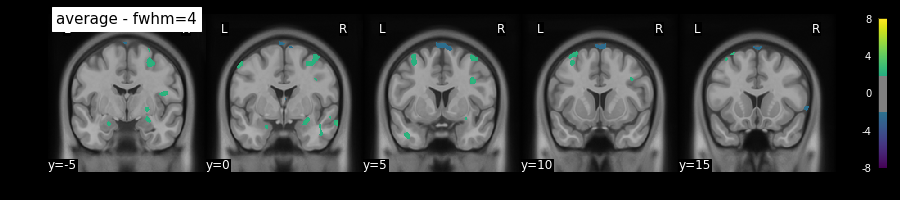

In [145]:
from nilearn.plotting import plot_stat_map
%matplotlib inline
template = '/home/zohyos7/fmri/mni_icbm152_nlin_asym_09c/1mm_T1.nii.gz'
plot_stat_map(
    '/data/wellbeing_analysis/datasink/1stLevel/sub-2505/fwhm-4_task_name_empathy/spmT_0009.nii', title='average - fwhm=4',
    bg_img=template, threshold=2, vmax=8, display_mode='y', cut_coords=(-5, 0, 5, 10, 15), cmap = 'viridis');

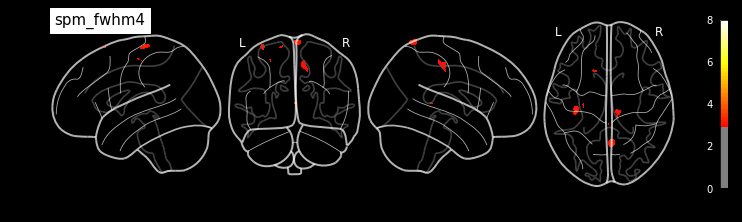

In [146]:
from nilearn.plotting import plot_glass_brain
plot_glass_brain(
    '/data/wellbeing_analysis/datasink/1stLevel/sub-2505/fwhm-4_task_name_empathy/spmT_0009.nii', colorbar=True,
    threshold=3, display_mode='lyrz', black_bg=True, vmax=8, title='spm_fwhm4');

In [134]:
?plot_glass_brain

Signature: plot_glass_brain(stat_map_img, output_file=None, display_mode='ortho', colorbar=False, figure=None, axes=None, title=None, threshold='auto', annotate=True, black_bg=False, cmap=None, alpha=0.7, vmin=None, vmax=None, plot_abs=True, symmetric_cbar='auto', resampling_interpolation='continuous', **kwargs)
Docstring:
Plot 2d projections of an ROI/mask image (by default 3 projections:
Frontal, Axial, and Lateral). The brain glass schematics
are added on top of the image.

The plotted image should be in MNI space for this function to work
properly.

Parameters
----------
stat_map_img : Niimg-like object
    See http://nilearn.github.io/manipulating_images/input_output.html
    The statistical map image. It needs to be in MNI space
    in order to align with the brain schematics.
output_file : string, or None, optional
    The name of an image file to export the plot to. Valid extensions
    are .png, .pdf, .svg. If output_file is not None, the plot
    is saved to a file, and the d